In [4]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import glob
import os

font_size = 100
plt.rcParams['font.family'] ='sans-serif'#使用するフォント
plt.rcParams['xtick.direction'] = 'in'#x軸の目盛線が内向き('in')か外向き('out')か双方向か('inout')
plt.rcParams['ytick.direction'] = 'in'#y軸の目盛線が内向き('in')か外向き('out')か双方向か('inout')
plt.rcParams['xtick.major.width'] = 1.0#x軸主目盛り線の線幅
plt.rcParams['ytick.major.width'] = 0.1#y軸主目盛り線の線幅
plt.rcParams['font.size'] = font_size #フォントの大きさ
plt.rcParams['axes.linewidth'] = 1.0# 軸の線幅edge linewidth。囲みの太さ

In [2]:
def nameEditor(name):
    return name.replace('__', '_').replace('v6','v1').replace('v7','v2').replace('v8','v3').split('_')

def nameFixor(name, randMode=False):
    for i in range(len(name)):
        if 'NoiseGenerator2D' in name[i]: name[i] = name[i].replace('NoiseGenerator2D', 'PG')
        if 'NoiseResNet32' in name[i]: name[i] = name[i].replace('NoiseResNet32', 'PD')
        if 'WGANGenerator32' in name[i]: name[i] = name[i].replace('WGANGenerator32', 'CG')
        if 'WGANDiscriminator32' in name[i]: name[i] = name[i].replace('WGANDiscriminator32', 'CD')
        if 'LCG' in name[i]: name[i] = name[i].replace('LCG', 'LC(UD)-')
        if 'MT' in name[i]: name[i] = name[i].replace('MT', 'MT(UD)-')
        if ('PGv1' == name[i] or 'PD' == name[i]) and randMode is not False: name[i] = name[i].replace('P', 'MT(SND)-P')
    return name

def plotISperEpoch(files_dir, ylim=0, xlim=0):
    plt.figure(figsize=(50,50))
    if ylim != 0: plt.ylim(0, ylim)
    if xlim != 0: plt.xlim(0, xlim)
    plt.xlabel('epoch')
    plt.ylabel('Inseption Score')
    plt.grid(color='gray')
    [dataset_name, comp_name] = files_dir.split('/')[2:4]
    plt.title('Evaluation for %s: %s type' %(dataset_name, comp_name))
    randMode = True if comp_name=='noise' else False
    for file in sorted(glob.glob(os.path.join(files_dir, '*'))):
        file_s = nameEditor(os.path.basename(file))
        file_s = nameFixor(file_s, randMode)
        with open(file, 'r') as f:
            line = f.readline()   
            epoch = []
            is_score = []
            max_score = []
            is_max = 0
            while line:
                line = f.readline()
                if 'Inception Score' in line:
                    data_ = line.split(' :')
                    data = data_[1].replace('] [', ',').replace('[', '').replace(']', '')
                    epoch_data, is_data, max_data = data.split(',')
                    epoch.append(int(epoch_data.split(': ')[1].split('/')[0]))
                    is_score.append(float(is_data.split(': ')[1]))
                    max_score.append(float(max_data.split(': ')[1]))
            is_max = max_score[len(max_score)-1]
            if 'CG' in file_s[1] and 'LCG' not in file_s[1]:
                plt.plot(epoch, is_score, linewidth = 5, alpha=0.8, label=file_s[1:3], color='red')
            else:
                plt.plot(epoch, is_score, linewidth = 5, alpha=0.8, label=file_s[1:3])
            plt.legend(loc='lower right', borderaxespad=1, fontsize=font_size)
    if ylim != 0: plt.yticks(np.arange(0, ylim+0.5, 0.5))
    plt.show()
    

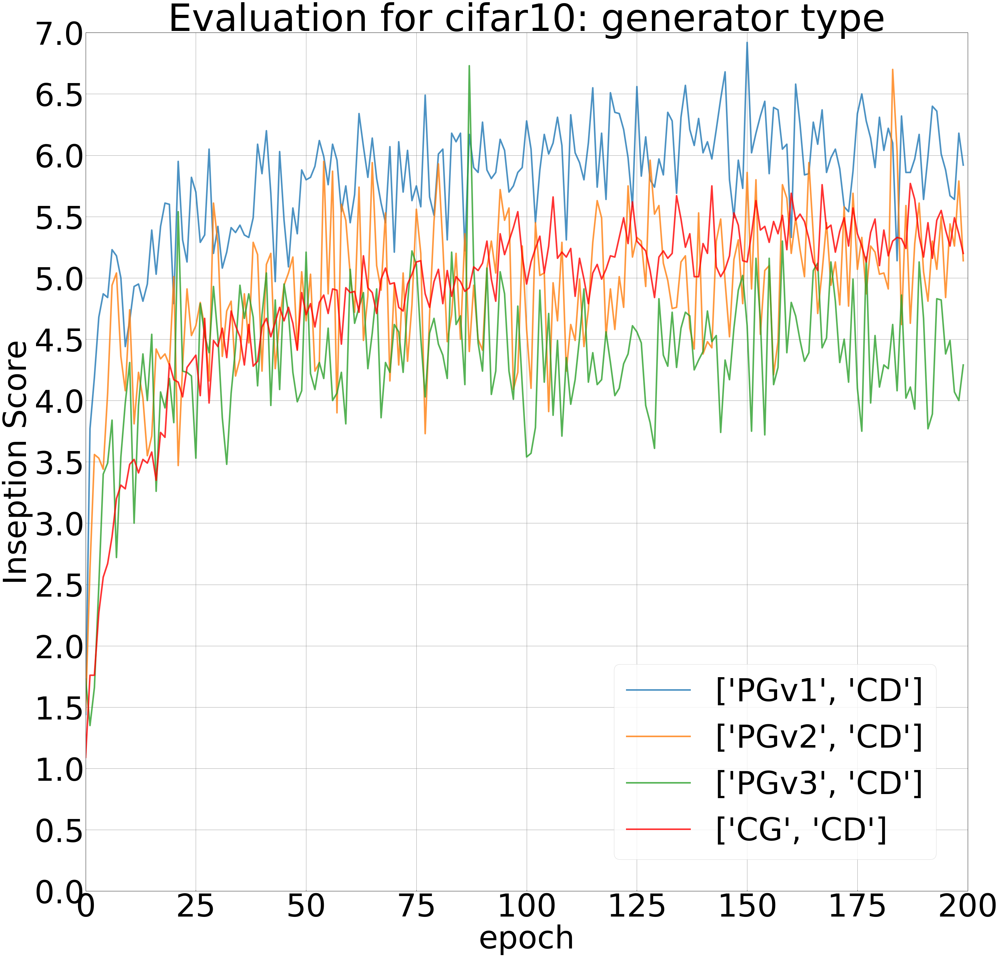

In [75]:
eval_files_dir = './evalIS/cifar10/generator'
plotISperEpoch(eval_files_dir, 7, 200)

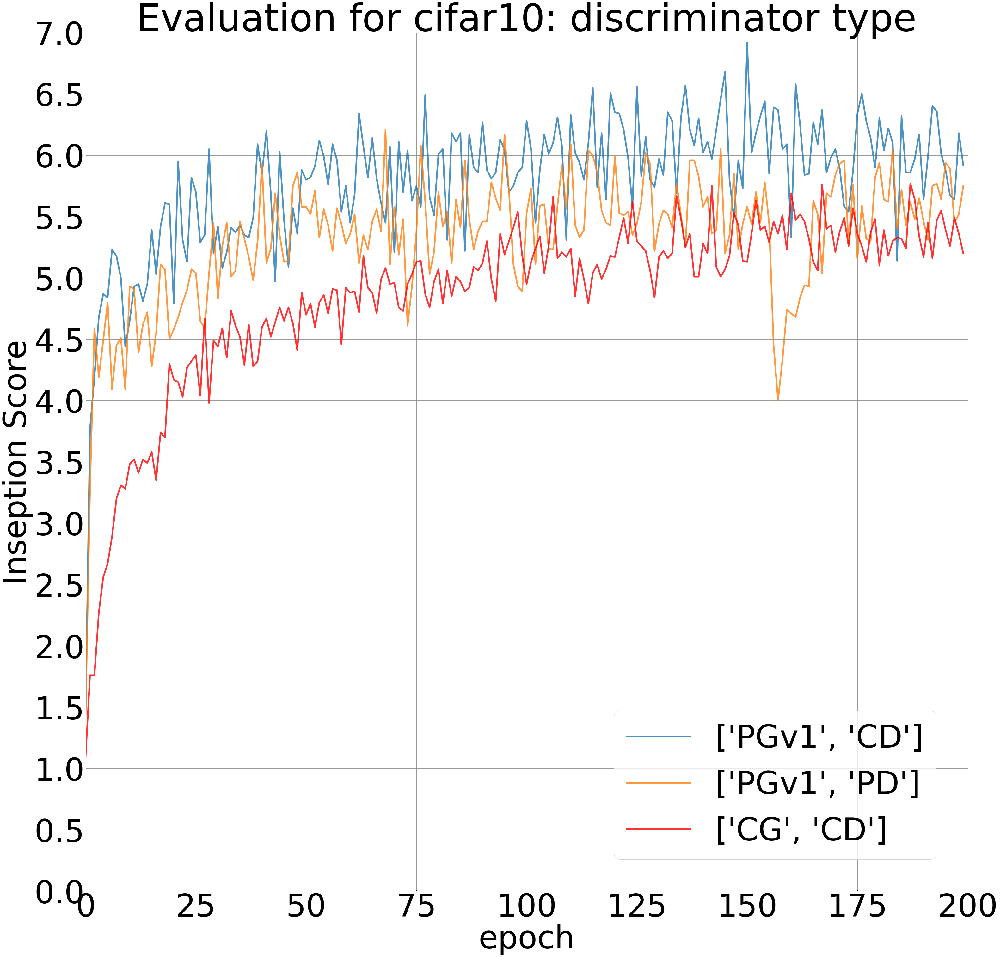

In [70]:
eval_files_dir = './evalIS/cifar10/discriminator'
plotISperEpoch(eval_files_dir, 7, 200)

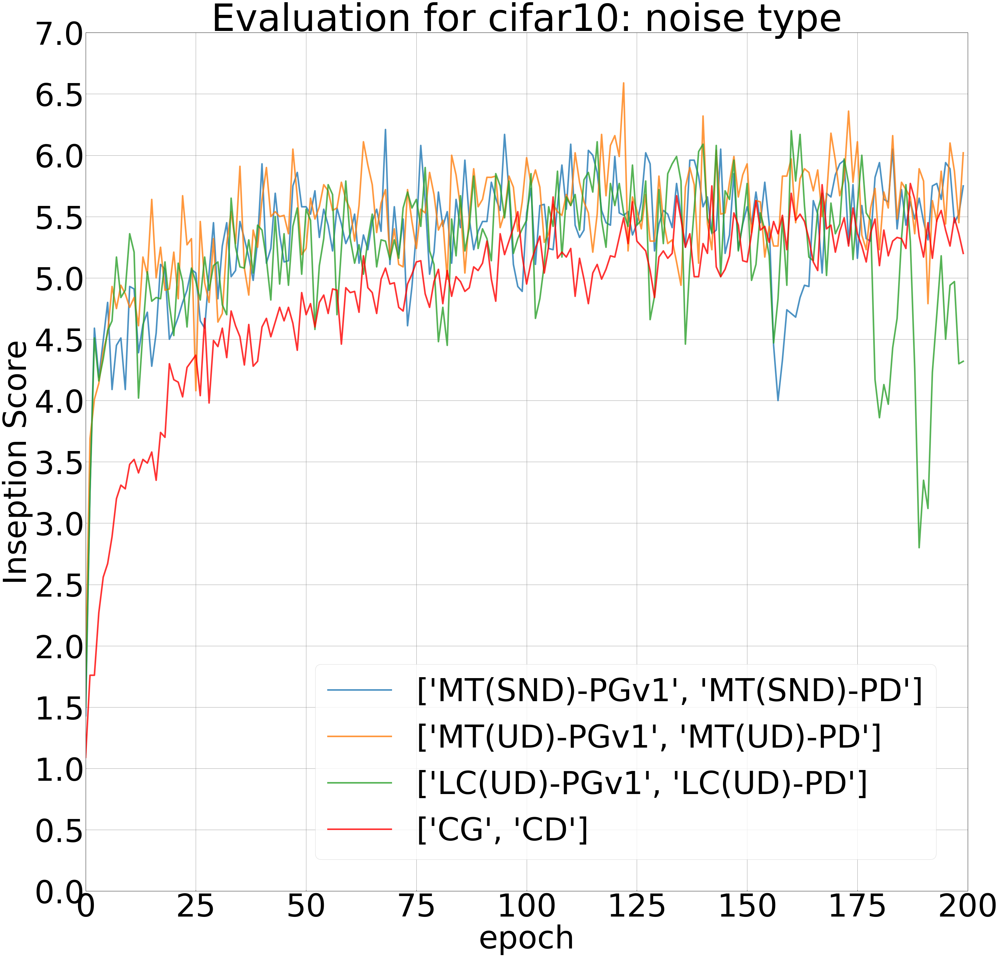

In [76]:
eval_files_dir = './evalIS/cifar10/noise'
plotISperEpoch(eval_files_dir, 7, 200)

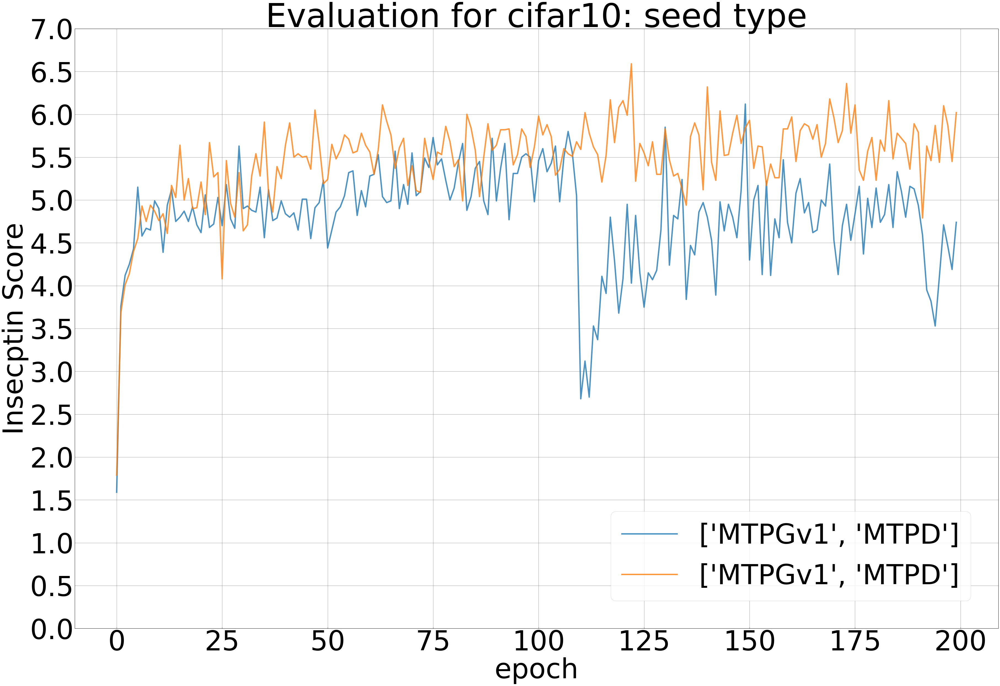

In [182]:
eval_files_dir = './evalIS/cifar10/mtn_seed'
plotISperEpoch(eval_files_dir, 7)

In [3]:
def plotISperIter(files_dir, ylim=0, xlim=0):
    plt.figure(figsize=(50,50))
    if ylim != 0: plt.ylim(0, ylim)
    if xlim != 0: plt.xlim(0, xlim)
    plt.xlabel('Iteration')
    plt.ylabel('Inseption Score')
    plt.grid(color='gray')
    plt.xticks(rotation=15)
    [dataset_name, comp_name] = files_dir.split('/')[2:4]
    plt.title('Evaluation for %s: %s type' %(dataset_name, comp_name))
    randMode = True if comp_name=='noise' else False
    for file in sorted(glob.glob(os.path.join(files_dir, '*'))):
        file_s = nameEditor(os.path.basename(file))
        file_s = nameFixor(file_s, randMode)
        if len(file_s) > 3:
            idx = file_s[0]
            g_name = file_s[1]
            d_name = file_s[2]
            dataset = file_s[3]
            with open(file, 'r') as f:
                line = f.readline()   
                epoch = []
                itert = []
                is_score = []
                max_score = []
                is_max = 0
                while line:
                    line = f.readline()
                    if 'Inception Score' in line:
                        data_ = line.split(' :')
                        data = data_[1].replace('] [', ',').replace('[', '').replace(']', '')
                        epoch_data, itert_data, is_data, max_data = data.split(',')
                        epoch.append(int(epoch_data.split(': ')[1].split('/')[0]))
                        itert.append(int(itert_data.split(': ')[1]))
                        is_score.append(float(is_data.split(': ')[1]))
                        max_score.append(float(max_data.split(': ')[1]))
                is_max = max_score[len(max_score)-1]
            if 'CG' in file_s[1] and 'LCG' not in file_s[1]:
                plt.plot(itert, is_score, linewidth = 5, alpha=0.8, label=file_s[1:3], color='red')
            else:
                plt.plot(itert, is_score, linewidth = 5, alpha=0.8, label=file_s[1:3])
            plt.legend(loc='lower right', borderaxespad=1, fontsize=font_size)
    if ylim != 0: plt.yticks(np.arange(0, ylim+0.5, 0.5))
    plt.show()
    

In [11]:
def saveSize(files_dir,file):
    with open(file, 'r') as f:
        line = f.readline()  
        while line:
            line = f.readline()
            if 'Inception Score' in line:
                 with open(os.path.join(files_dir, 'out.log'), 'a') as g:
                    g.write(line)

In [13]:
files_dir = './evalIS/lsun/ope'
file = './evalIS/lsun/ope/train.log'
saveSize(files_dir, file)

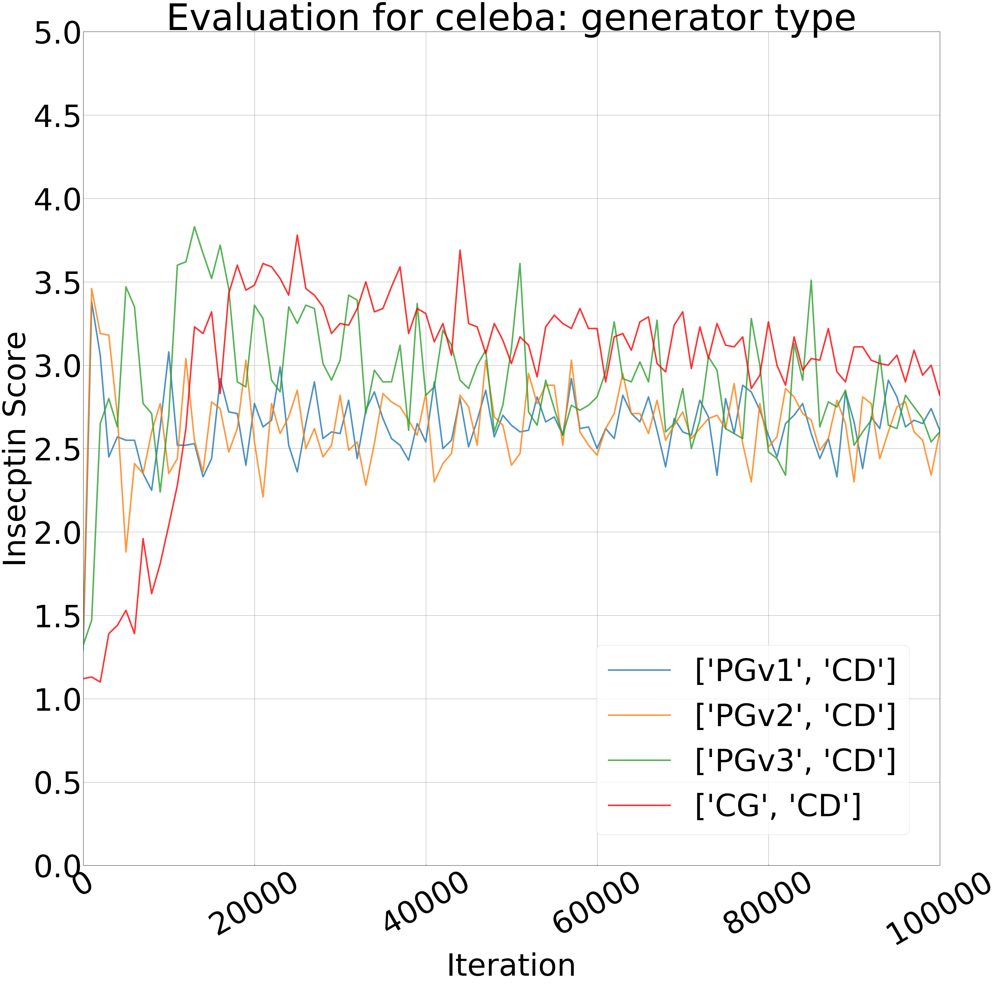

In [24]:
eval_files_dir = './evalIS/celeba/generator'
plotISperIter(eval_files_dir, ylim=5, xlim=100000)

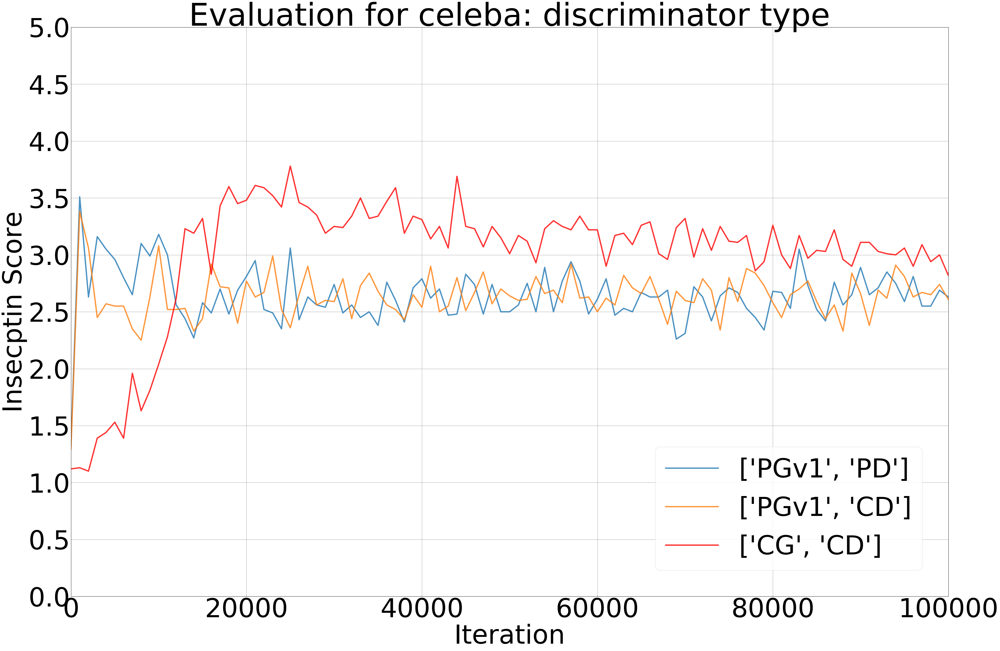

In [185]:
eval_files_dir = './evalIS/celeba/discriminator'
plotISperIter(eval_files_dir, ylim=5, xlim=100000)

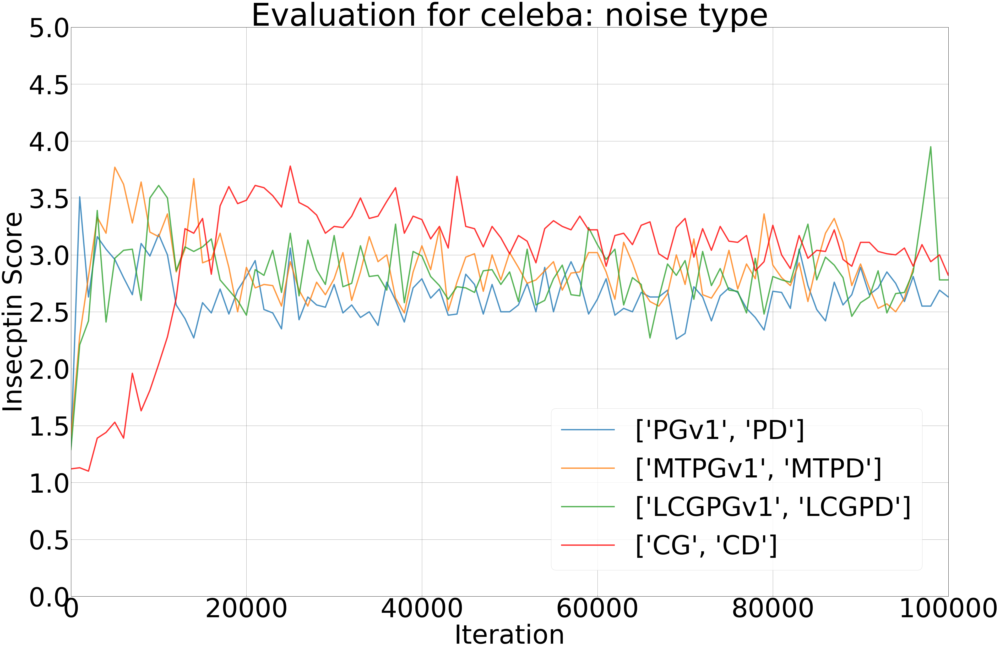

In [203]:
eval_files_dir = './evalIS/celeba/noise'
plotISperIter(eval_files_dir, ylim=5, xlim=100000)

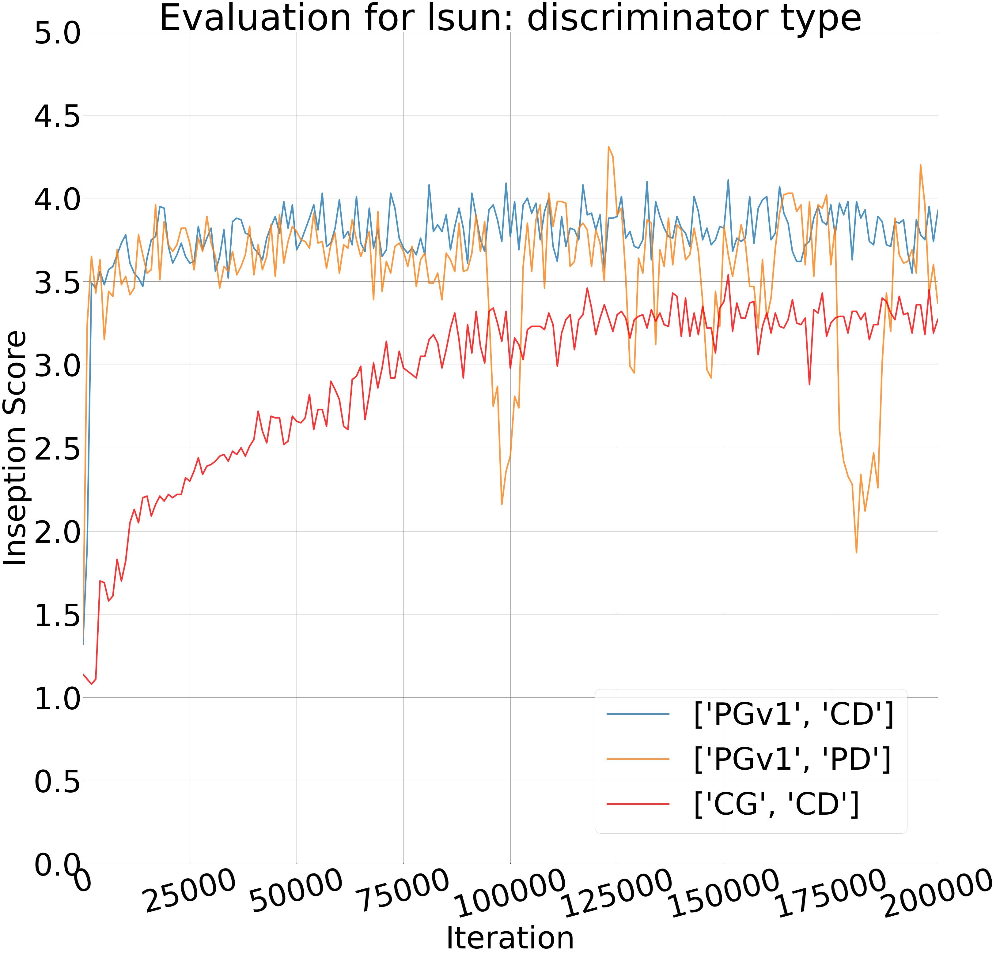

In [41]:
eval_files_dir = './evalIS/lsun/discriminator'
plotISperIter(eval_files_dir, ylim=5, xlim=200000)

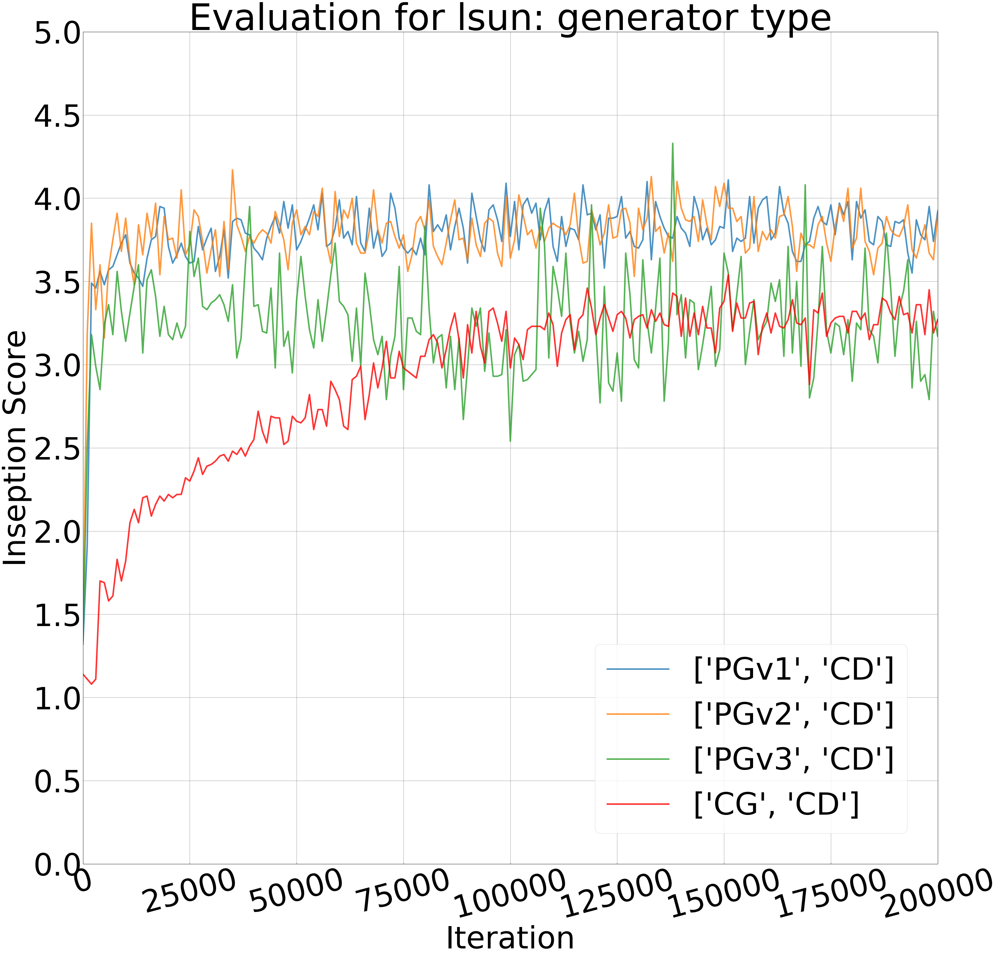

In [42]:
eval_files_dir = './evalIS/lsun/generator'
plotISperIter(eval_files_dir, ylim=5, xlim=200000)

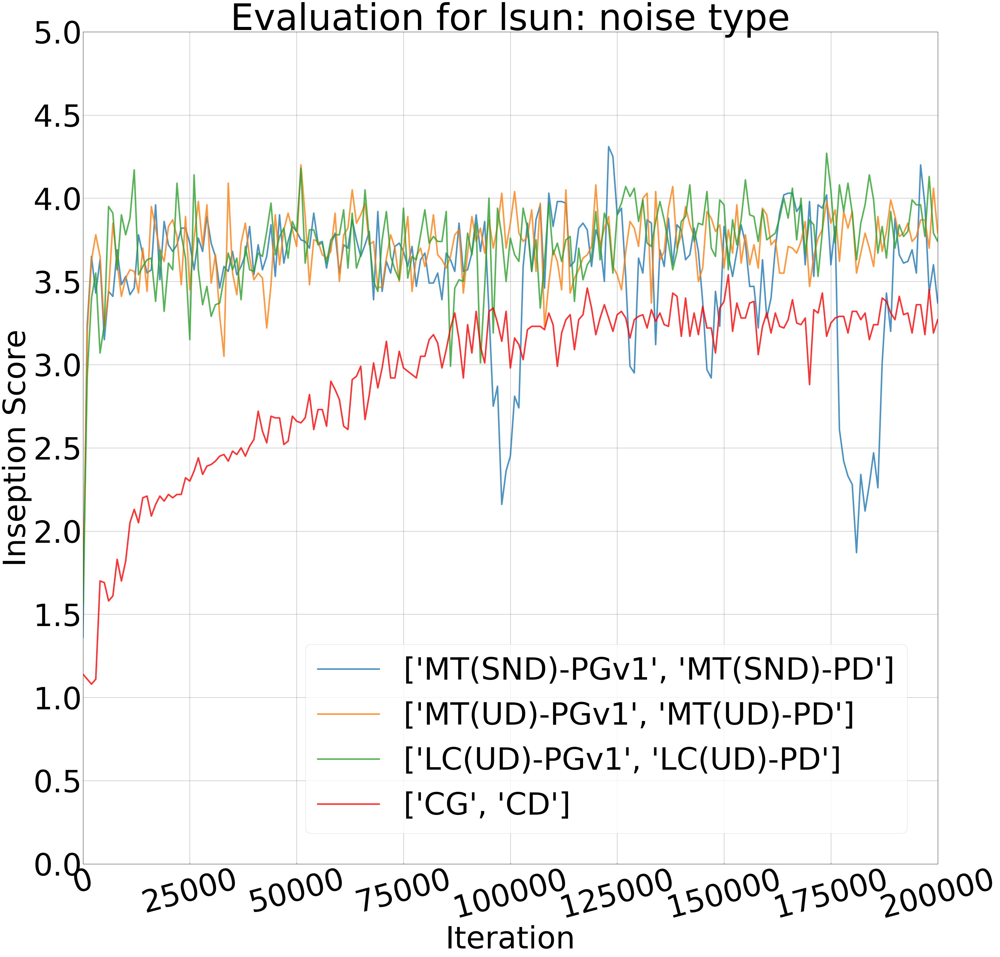

In [79]:
eval_files_dir = './evalIS/lsun/noise'
plotISperIter(eval_files_dir, ylim=5, xlim=200000)

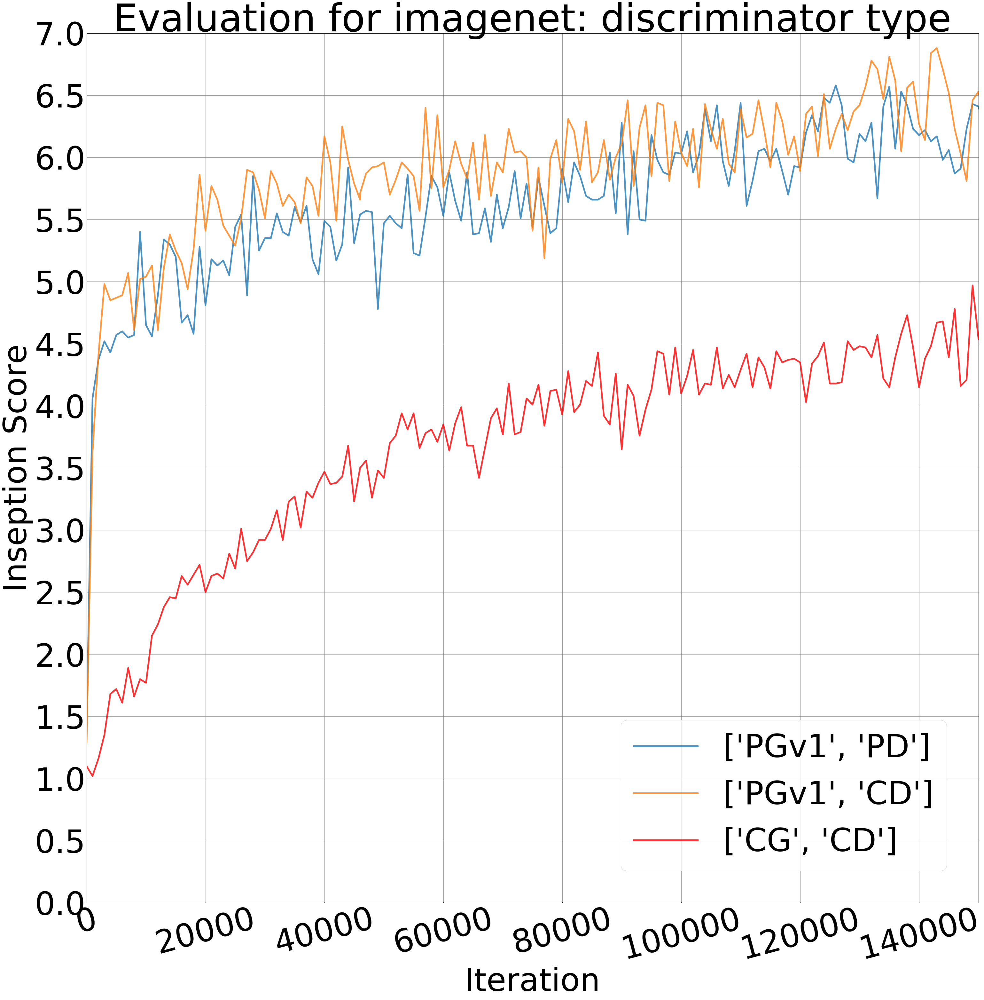

In [88]:
eval_files_dir = './evalIS/imagenet/discriminator'
plotISperIter(eval_files_dir, ylim=7, xlim=150000)

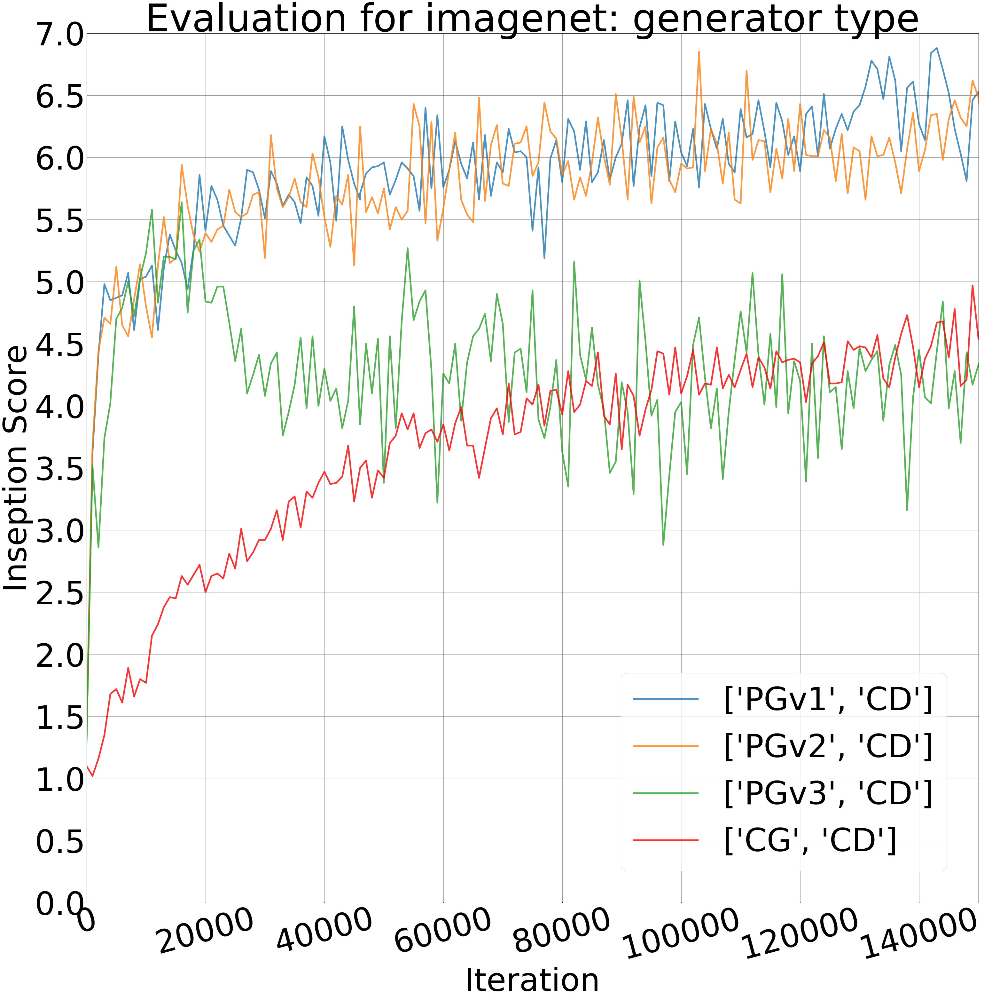

In [4]:
eval_files_dir = './evalIS/imagenet/generator'
plotISperIter(eval_files_dir, ylim=7, xlim=150000)

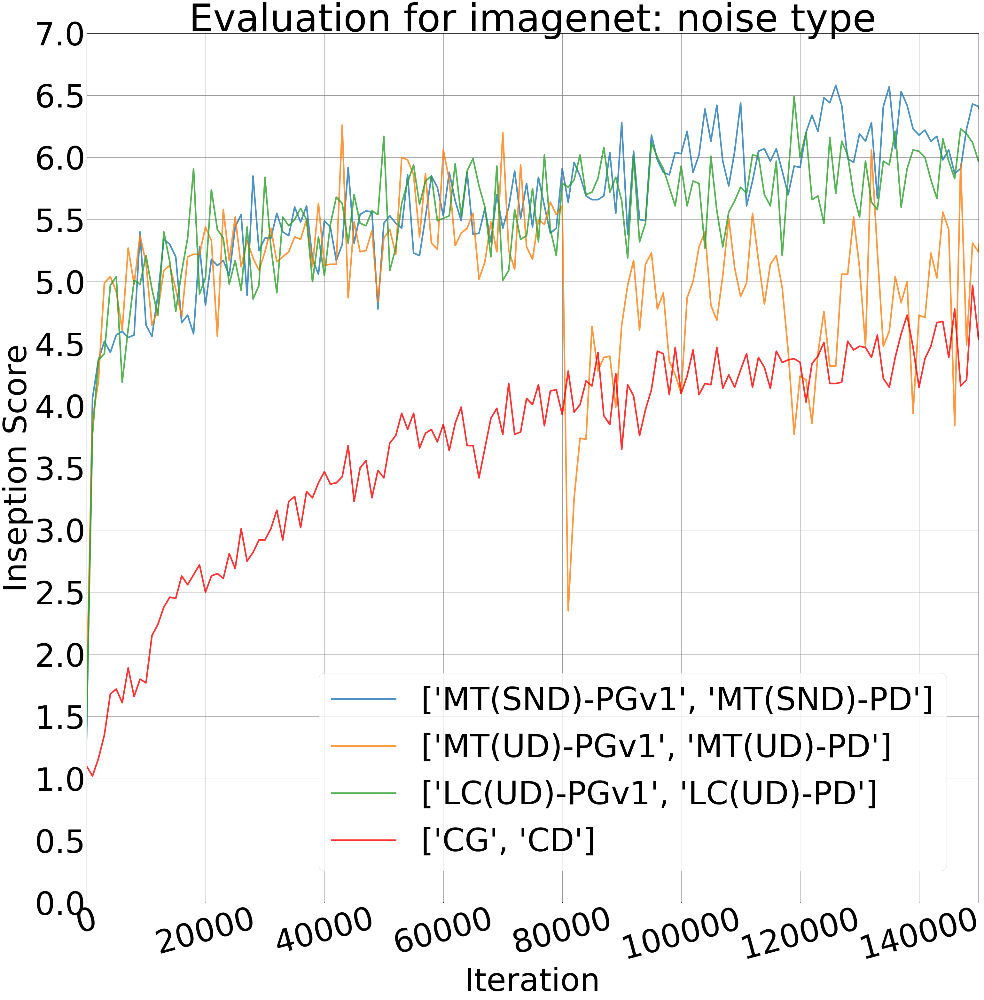

In [90]:
eval_files_dir = './evalIS/imagenet/noise'
plotISperIter(eval_files_dir, ylim=7, xlim=150000)

In [84]:
def plotISperIterSeed(files_dir, ylim=0, xlim=0, title=None):
    plt.figure(figsize=(50,50))
    if ylim != 0: plt.ylim(0, ylim)
    if xlim != 0: plt.xlim(0, xlim)
    plt.xlabel('epoch')
    plt.ylabel('Inseption Score')
    plt.grid(color='gray')
    [dataset_name, comp_name] = files_dir.split('/')[2:4]
    if title is not None:
        plt.title('Noise mask dependence for %s: %s' %(dataset_name, title))
    else:
        plt.title('Evaluation for %s: %s type' %(dataset_name, comp_name))
    i = 0
    for file in sorted(glob.glob(os.path.join(files_dir, '*'))):
        file_s = nameEditor(os.path.basename(file))
        file_s = nameFixor(file_s)
        if len(file_s) > 3:
            idx = file_s[0]
            g_name = file_s[1]
            d_name = file_s[2]
            dataset = file_s[3]
            with open(file, 'r') as f:
                line = f.readline()   
                epoch = []
                itert = []
                is_score = []
                max_score = []
                is_max = 0
                while line:
                    line = f.readline()
                    if 'Inception Score' in line:
                        data_ = line.split(' :')
                        data = data_[1].replace('] [', ',').replace('[', '').replace(']', '')
                        epoch_data, itert_data, is_data, max_data = data.split(',')
                        epoch.append(int(epoch_data.split(': ')[1].split('/')[0]))
                        itert.append(int(itert_data.split(': ')[1])/782)
                        is_score.append(float(is_data.split(': ')[1]))
                        max_score.append(float(max_data.split(': ')[1]))
                is_max = max_score[len(max_score)-1]
            if 'CG' in file_s[1] and 'LCG' not in file_s[1]:
                plt.plot(itert, is_score, linewidth = 5, alpha=0.8, label=file_s[1:3], color='red')
            else:
                plt.plot(itert, is_score, linewidth = 5, alpha=0.8, label='seed%d'%(i))
                i+=1
            plt.legend(loc='lower right', borderaxespad=1, fontsize=font_size)
    if ylim != 0: plt.yticks(np.arange(0, ylim+0.5, 0.5))
    plt.show()
    

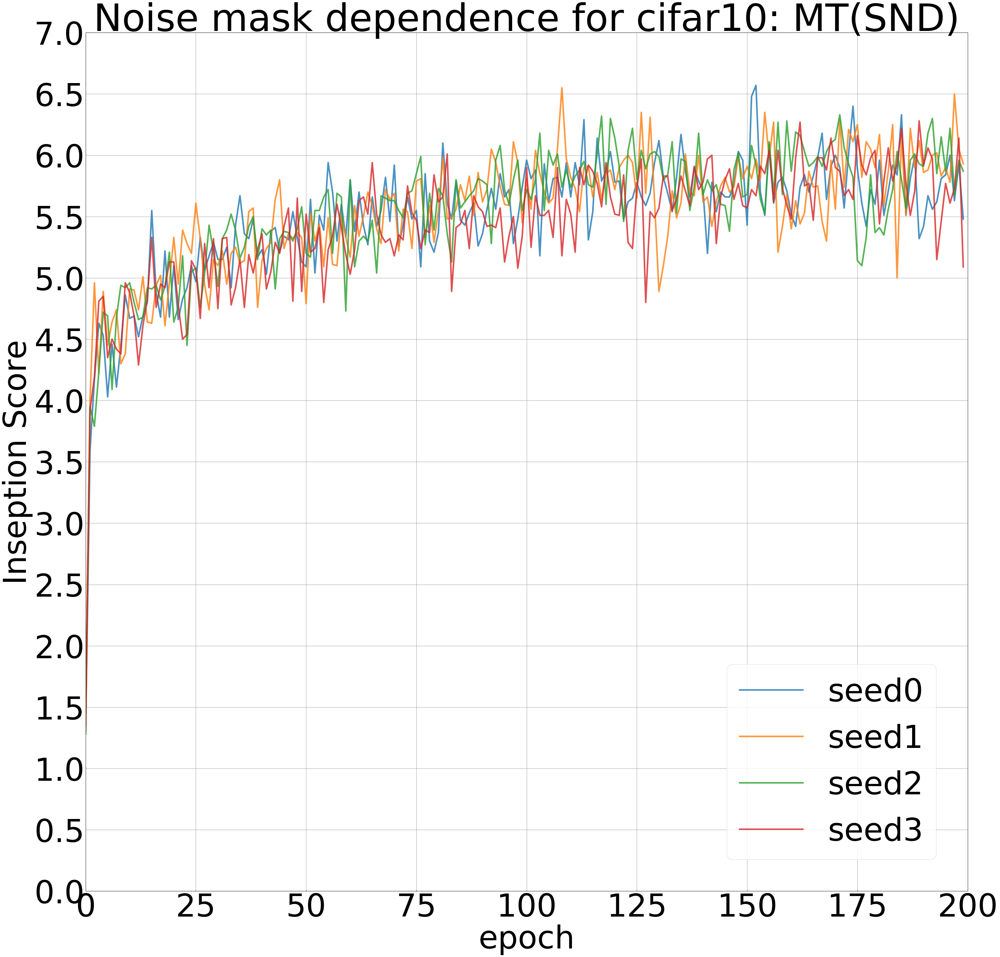

In [85]:
eval_files_dir = './evalIS/cifar10/seed'
plotISperIterSeed(eval_files_dir, 7, 200, title='MT(SND)')

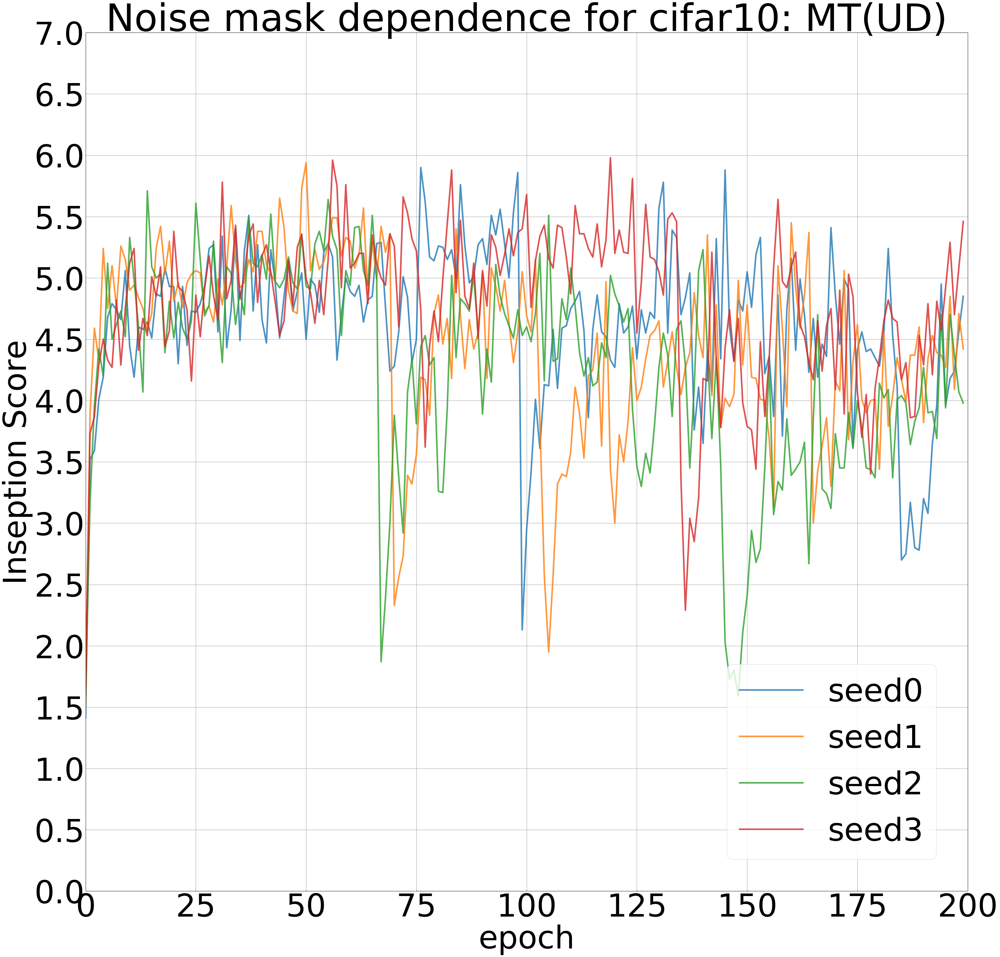

In [86]:
eval_files_dir = './evalIS/cifar10/mt_seed'
plotISperIterSeed(eval_files_dir, 7, 200, title='MT(UD)')

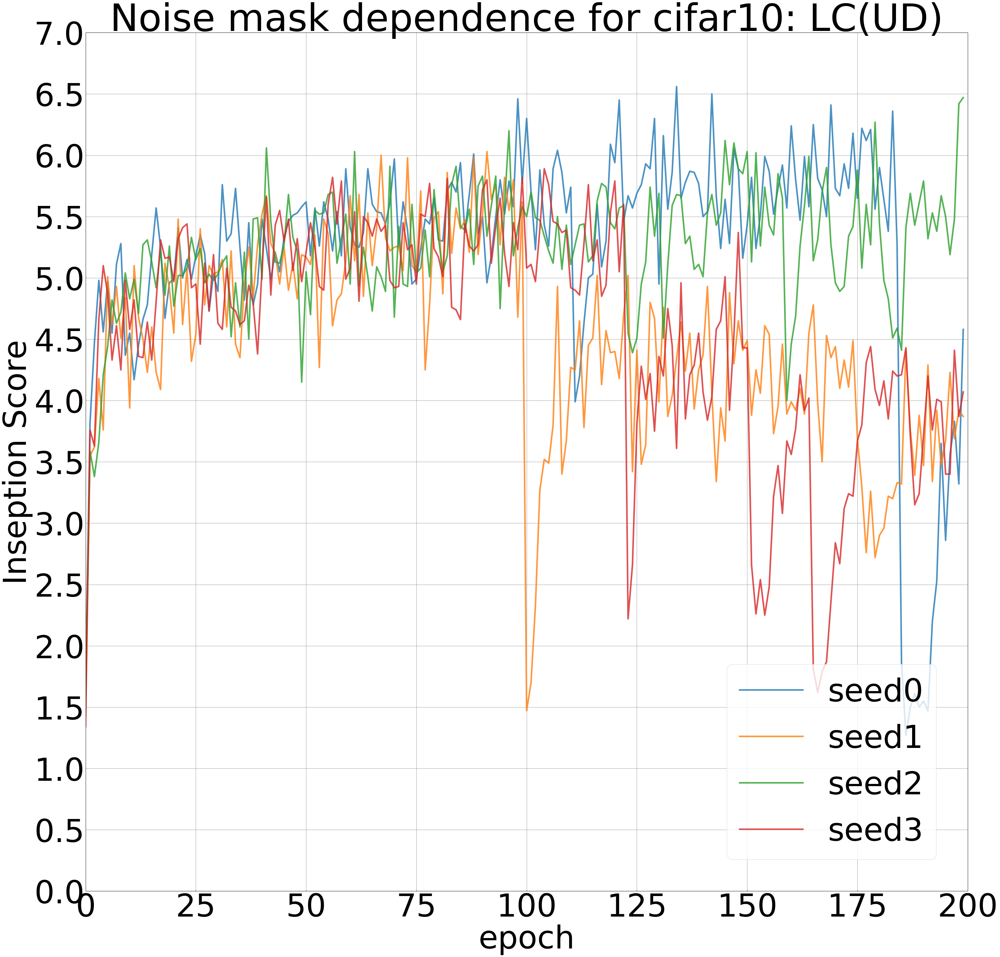

In [87]:
eval_files_dir = './evalIS/cifar10/lc_seed'
plotISperIterSeed(eval_files_dir, 7, 200, title='LC(UD)')